In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
from sklearn.model_selection import train_test_split

from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_poisson_deviance
from sklearn.metrics import mean_gamma_deviance
from sklearn.metrics import mean_tweedie_deviance
from sklearn.metrics import mean_squared_log_error

In [104]:
data = pd.read_csv('../NormalizedWeatherDataD.csv', sep=';')

data.describe()

#handle geographical data
#we have 3 columns with geographical data
#test while keeping them



,Date,Type de tendance barométrique,Vitesse du vent moyen 10 mn,Humidité,Variation de pression en 24 heures,Rafale sur les 10 dernières minutes,Précipitations dans les 24 dernières heures,Température (°C),Latitude,Longitude,Altitude
count,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000
mean,181.758325,0.540945,0.151609,0.727043,0.480349,0.158559,0.014287,0.489141,0.541388,0.492306,0.204036
std,105.301950,0.338915,0.100956,0.195087,0.098096,0.101743,0.039848,0.146888,0.293842,0.240280,0.226570
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.375000,0.250000,0.081550,0.595960,0.422780,0.084030,0.000870,0.386740,0.255130,0.317470,0.048130
50%,181.250000,0.500000,0.128760,0.767680,0.478760,0.137250,0.000870,0.482500,0.598920,0.487280,0.132370
75%,273.125000,0.875000,0.201720,0.888890,0.534750,0.210080,0.006060,0.585640,0.835920,0.682860,0.280390
max,364.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [105]:
#predicting the temperature for the next 24 hours first


X = data.drop(['Température (°C)'], axis=1)
Y = data['Température (°C)']
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=0)
DROPOUT = 0.2

In [106]:
model = Sequential()
model.add(Dense(64,input_shape=(10,),activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(32,activation='relu'))

model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(16,activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(8,activation='relu'))

model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(1,activation='linear'))

model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mean_squared_error'])


In [107]:
history = model.fit(X_train,Y_train,epochs=50,validation_data=(X_test,Y_test))



Epoch 1/50
2517/2517 [==============================] - 4s 1ms/step - loss: 6.5184 - mean_squared_error: 6.5184 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 2/50
2517/2517 [==============================] - 4s 1ms/step - loss: 0.0532 - mean_squared_error: 0.0532 - val_loss: 0.0216 - val_mean_squared_error: 0.0216
Epoch 3/50
2517/2517 [==============================] - 4s 1ms/step - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0216 - val_mean_squared_error: 0.0216
Epoch 4/50
2517/2517 [==============================] - 4s 1ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0216 - val_mean_squared_error: 0.0216
Epoch 5/50
2517/2517 [==============================] - 4s 1ms/step - loss: 0.0217 - mean_squared_error: 0.0217 - val_loss: 0.0216 - val_mean_squared_error: 0.0216
Epoch 6/50
2517/2517 [==============================] - 4s 2ms/step - loss: 0.0222 - mean_squared_error: 0.0222 - val_loss: 0.0216 - val_mean_squared_error: 0.0216
Epoch 7/50
2517/

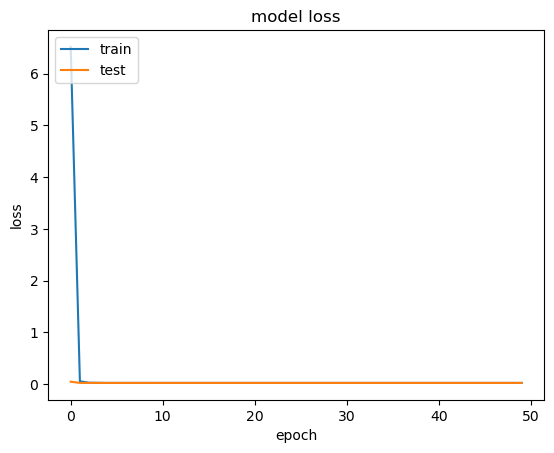

630/630 [==============================] - 1s 928us/step
-2.7282254123184302e-05 r2_score


In [121]:
# plot curves and points
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

plt.show()

# plot with plotly
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['loss'], name='train'))
fig.add_trace(go.Scatter(y=history.history['val_loss'], name='test'))
fig.update_layout(title='model loss', xaxis_title='epoch', yaxis_title='loss')
fig.show()


print(r2_score(Y_test, model.predict(X_test)),'r2_score')

meilleur pr l'instant : mse : 0.0110; r2 : 0.4460025472293939
OU mse : 0.0128 et r2 : 0.4204298986741123 


pistes : retirer données géo ? d'autres ? 
100 epochs pas mal
#erreur resultats negatifs


In [120]:
# pred = model.predict(X_test)
# print(Y_test)
# plt.scatter(Y_test, pred[:,0])
# plt.xlabel('True Values [Température (°C)]')
# plt.ylabel('Predictions [Température (°C)]')
# plt.axis('equal')
# plt.show()

# plot with plotly
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=Y_test, y=pred[:,0], mode='markers', name='Predictions'))
fig.add_trace(go.Scatter(x=Y_test, y=Y_test, mode='lines', name='True Values'))
fig.show()


In [119]:
import plotly.graph_objs as go
import plotly.express as px
import pandas as pd


# Define the scatter plot
fig = px.scatter(data,  x='Température (°C)', y='Altitude', trendline='ols')

# Add x and y axis labels
fig.update_xaxes(title_text='Température (°C)')
fig.update_yaxes(title_text='Altitude')

# Add a title
fig.update_layout(title_text='Température (°C) vs Altitude')

# Display the plot
fig.show()


In [ ]:
# predict temperature, humidity and precipitation for the next 24 hours
X = data.drop(['Température (°C)','Humidité','Précipitations dans les 24 dernières heures'], axis=1)
Y = data[['Température (°C)','Humidité','Précipitations dans les 24 dernières heures']]
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=0)
DROPOUT = 0.2

data.describe()

,Date,Type de tendance barométrique,Vitesse du vent moyen 10 mn,Humidité,Variation de pression en 24 heures,Rafale sur les 10 dernières minutes,Précipitations dans les 24 dernières heures,Température (°C),Latitude,Longitude,Altitude
count,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000,100659.000000
mean,181.758325,0.540945,0.151609,0.727043,0.480349,0.158559,0.014287,0.489141,0.541388,0.492306,0.204036
std,105.301950,0.338915,0.100956,0.195087,0.098096,0.101743,0.039848,0.146888,0.293842,0.240280,0.226570
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.375000,0.250000,0.081550,0.595960,0.422780,0.084030,0.000870,0.386740,0.255130,0.317470,0.048130
50%,181.250000,0.500000,0.128760,0.767680,0.478760,0.137250,0.000870,0.482500,0.598920,0.487280,0.132370
75%,273.125000,0.875000,0.201720,0.888890,0.534750,0.210080,0.006060,0.585640,0.835920,0.682860,0.280390
max,364.875000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
model = Sequential()
model.add(Dense(64,input_shape=(8,),activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(32,activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(16,activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(8,activation='relu'))
model.add(tf.keras.layers.Dropout(DROPOUT))
model.add(Dense(3,activation='linear'))

model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mean_squared_error'])
history = model.fit(X_train,Y_train,epochs=70,validation_data=(X_test,Y_test))
            

Epoch 1/70
2517/2517 [==============================] - 5s 2ms/step - loss: 3.4616 - mean_squared_error: 3.4616 - val_loss: 0.0250 - val_mean_squared_error: 0.0250
Epoch 2/70
2517/2517 [==============================] - 4s 2ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 3/70
 767/2517 [========>.....................] - ETA: 3s - loss: 0.0239 - mean_squared_error: 0.0239

KeyboardInterrupt: 

100 epochs bcp trop
res : 
mse : 0.0204
r2 : - 0.001309145847158651 > nul

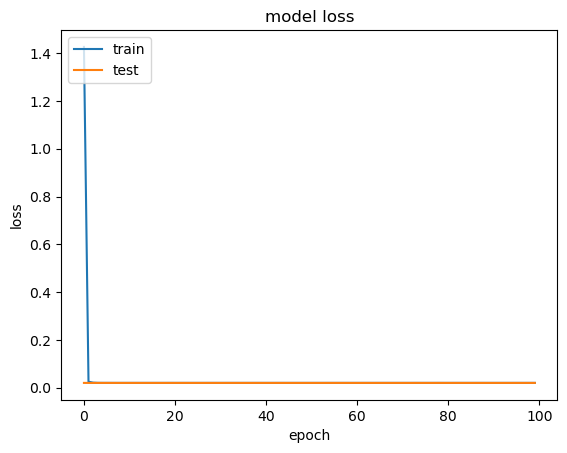

630/630 [==============================] - 1s 786us/step
-0.001309145847158651 r2_score


In [ ]:
# plot curves and points
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

print(r2_score(Y_test, model.predict(X_test)),'r2_score')